# Demo kernel PCA

Adapted by <alberto.suarez@uam.es>  from

[Kernel PCA (sklearn)](https://scikit-learn.org/stable/auto_examples/decomposition/plot_kernel_pca.html#sphx-glr-auto-examples-decomposition-plot-kernel-pca-py)   
Authors: Mathieu Blondel, Andreas Mueller
          
License: [BSD 3 clause](https://opensource.org/licenses/BSD-3-Clause)	
 


In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

from sklearn.decomposition import PCA, KernelPCA
from sklearn import datasets
import kernel_machine_learning as kpca

In [2]:
# Input data

np.random.seed(0) # for reproductible results
# X, y = datasets.make_circles(n_samples=400, factor=.3, noise=.05)
X, y = datasets.make_moons(n_samples=400, noise=.05)


In [3]:
# Principal componets

# PCA (linear)

X_pca, eigenvals_pca, eigenvecs_pca = kpca.kernel_pca(X, X, kpca.linear_kernel)

# Kernel PCA

A = 1.0
gamma = 20.0
L = np.sqrt(0.5 / gamma)
def rbf_kernel (X, X_prime):
    return kpca.rbf_kernel(X, X_prime, A, L)

X_kpca, eigenvals_kpca, eigenvecs_kpca = kpca.kernel_pca(X, X, rbf_kernel)

# PCA (sklearn)
pca = PCA()
X_pca_sk = pca.fit_transform(X)

# Kernel PCA (sklearn)

kernel_pca = KernelPCA(kernel='rbf', fit_inverse_transform=True, gamma=gamma)
X_kpca_sk = kernel_pca.fit_transform(X)
X_back = kernel_pca.inverse_transform(X_kpca_sk)

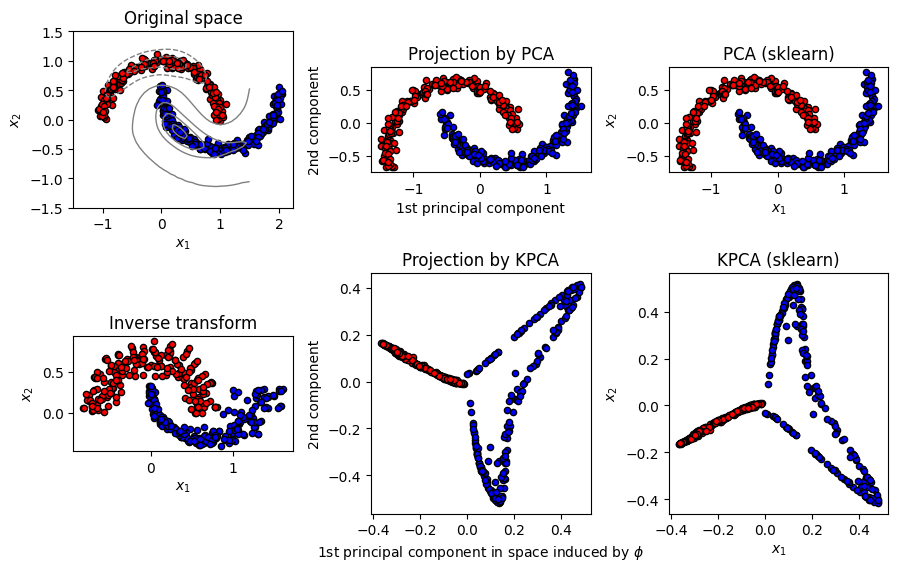

In [4]:
# Plot results

plt.figure(figsize=(9,6))
plt.subplot(2, 3, 1, aspect='equal')
plt.title('Original space')
reds = y == 0
blues = y == 1

plt.scatter(X[reds, 0], X[reds, 1], c='red',
            s=20, edgecolor='k')
plt.scatter(X[blues, 0], X[blues, 1], c='blue',
            s=20, edgecolor='k')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')

X1, X2 = np.meshgrid(np.linspace(-1.5, 1.5, 50), np.linspace(-1.5, 1.5, 50))
X_grid = np.array([np.ravel(X1), np.ravel(X2)]).T

# projection on the first principal component (in the phi space)
Z_grid = kernel_pca.transform(X_grid)[:, 0].reshape(X1.shape)
plt.contour(X1, X2, Z_grid, colors='grey', linewidths=1, origin='lower')


plt.subplot(2, 3, 4, aspect='equal')
plt.scatter(X_back[reds, 0], X_back[reds, 1], c="red",
            s=20, edgecolor='k')
plt.scatter(X_back[blues, 0], X_back[blues, 1], c="blue",
            s=20, edgecolor='k')
plt.title("Inverse transform")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")


plt.subplot(2, 3, 2, aspect='equal')
plt.scatter(X_pca[reds, 0], X_pca[reds, 1], c="red",
            s=20, edgecolor='k')
plt.scatter(X_pca[blues, 0], X_pca[blues, 1], c="blue",
            s=20, edgecolor='k')
plt.title("Projection by PCA")
plt.xlabel("1st principal component")
plt.ylabel("2nd component")

plt.subplot(2, 3, 5, aspect='equal')
plt.scatter(X_kpca[reds, 0], X_kpca[reds, 1], c="red",
            s=20, edgecolor='k')
plt.scatter(X_kpca[blues, 0], X_kpca[blues, 1], c="blue",
            s=20, edgecolor='k')
plt.title("Projection by KPCA")
plt.xlabel(r"1st principal component in space induced by $\phi$")
plt.ylabel("2nd component")

plt.subplot(2, 3, 3, aspect='equal')
plt.scatter(X_pca_sk[reds, 0], X_pca_sk[reds, 1], c="red",
            s=20, edgecolor='k')
plt.scatter(X_pca_sk[blues, 0], X_pca_sk[blues, 1], c="blue",
            s=20, edgecolor='k')
plt.title("PCA (sklearn)")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")


plt.subplot(2, 3, 6, aspect='equal')
plt.scatter(X_kpca_sk[reds, 0], X_kpca_sk[reds, 1], c="red",
            s=20, edgecolor='k')
plt.scatter(X_kpca_sk[blues, 0], X_kpca_sk[blues, 1], c="blue",
            s=20, edgecolor='k')
plt.title("KPCA (sklearn)")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")

plt.tight_layout()
plt.show()

## Exercises
1. Implement the function **kernel_pca** del fichero *kernel_machine_learning.py*.
2. Why do the projections onto the first two KPCA principal components look different for the sklearn and our implementation? Is any of the two incorrect?
3. Vary the parameters of the kernel and comment on the behavior of the projections onto the first two KPCA components for the different values considered (e.g. $\gamma \in \left\{0.02, 0.2, 2.0, 20.0, 200.0, 2000.0\right\}$). In particular,
    1. What is the behaviour in the limit in which the width of the kernel approaches $\infty$. Explain why one should expect such behavior.
    2. What is the behaviour in the limit in which the width of the kernel approaches $0$. Explain why one should expect such behavior.
4. (Extra point) Make an animation that shows the evolution of the projections onto the first two KPCA components with $ 0.002 < \gamma < 20000.0$. 

**2. Why do the projections onto the first two KPCA principal components look different for the sklearn and our implementation? Is any of the two incorrect?**

The projections onto the first two KPCA princopal components are different because the normalization used by sklearn and the one made by us is different. We use the RKHS normalization, where each eigenvector is divided by the square root of its correspondin eigenvalue. In the sklearn implementation, the eigenvectors are normalized using L2, resulting in their norm to be 1. Therefore, their scale or orientation may differ from our so the projections do not exactly the same.

However, both implementations are mathematically correct as they just differ in normalization methods and, as the projections show, both are pretty similar and both separate the classes correctly.

**3. Vary the parameters of the kernel and comment on the behavior of the projections onto the first two KPCA components for the different values considered (e.g. $\gamma \in \left\{0.02, 0.2, 2.0, 20.0, 200.0, 2000.0\right\}$). In particular,**

1. **What is the behaviour in the limit in which the width of the kernel approaches $\infty$. Explain why one should expect such behavior.**

2. **What is the behaviour in the limit in which the width of the kernel approaches $0$. Explain why one should expect such behavior.**


W know that $\gamma = \frac{1}{2\sigma^2}$. Let us study the two situations mathematically;

As the width of the kernel approaches $\infty$, thus, $\gamma \rightarrow 0 \iff \sigma \rightarrow \infty$ we have that the kernel expression becomes:
$$
K(\bm{x}, \bm{x'}) = exp(-\gamma || \bm{x}, \bm{x'} ||^2) \rightarrow K(\bm{x}, \bm{x'}) = exp(-0) = 1
$$

Then, the kernel matrix becomes a constant, so every eigenvalue are zero but the first one. This means that there is only one principal components, and in the projection the first component captures all the variance and the rest of the components are meaningless. This kernel cannot distiguish non-linearity in the data and behaves as PCA.

As the width of the kernel approaches 0, thus, $\gamma \rightarrow \infty \iff \sigma \rightarrow 0$ we have that the kernel expression becomes:
$$
K(\bm{x}, \bm{x'}) = exp(-\gamma || \bm{x}, \bm{x'} ||^2) \rightarrow K(\bm{x}, \bm{x'}) = exp(-\infty) = 0
$$

Then, the kernel matrix becomes the identity matrix (a diagonal matrix). Thus, each point is mapped separately to the others, in independent directions of the feature space. This leads to overfitting, where each point is relevant in the principal component.

Now, after plotting the projections, we can see that if the value of $\gamma$ is small (tends to 0), the kernel cannot separate the classes if they are nonlinear. The behaviour is similar to PCA, as expected.

As the value of $\gamma$ increses (tends to $\infty$), the mapping of the projections cannto capture the global structure of the clases and they spread the data out. We lose the relevant structure we see for intermediate $\gamma$ values.

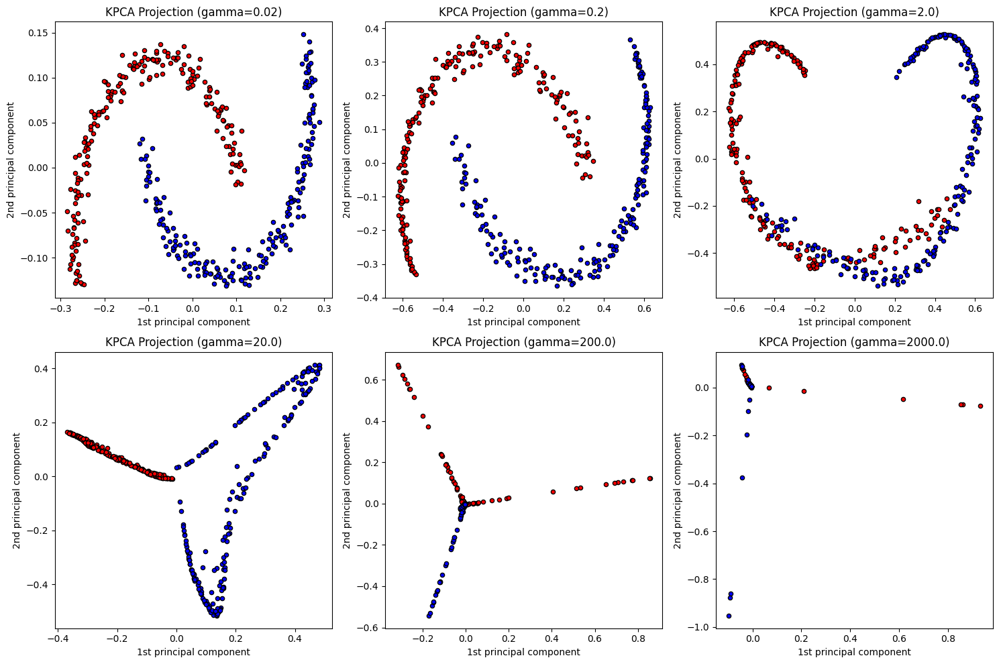

In [5]:
# Define gamma values to test
gamma_values = [0.02, 0.2, 2.0, 20.0, 200.0, 2000.0]

# Set up figure
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

# Loop over gamma values and perform KPCA
for i, gamma in enumerate(gamma_values):
    L = np.sqrt(0.5 / gamma)
    
    def rbf_kernel(X, X_prime):
        return kpca.rbf_kernel(X, X_prime, A=1.0, ls=L)
    
    X_kpca, _, _ = kpca.kernel_pca(X, X, rbf_kernel)
    
    # Plot the projections
    reds = y == 0
    blues = y == 1
    
    axes[i].scatter(X_kpca[reds, 0], X_kpca[reds, 1], c='red', s=20, edgecolor='k')
    axes[i].scatter(X_kpca[blues, 0], X_kpca[blues, 1], c='blue', s=20, edgecolor='k')
    axes[i].set_title(f'KPCA Projection (gamma={gamma})')
    axes[i].set_xlabel('1st principal component')
    axes[i].set_ylabel('2nd principal component')

plt.tight_layout()
plt.show()

**4. (Extra point) Make an animation that shows the evolution of the projections onto the first two KPCA components with $ 0.002 < \gamma < 20000.0$.**

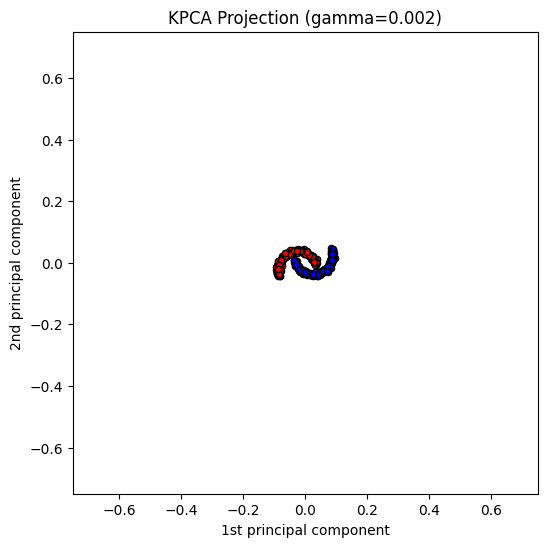

In [6]:
# Define log-scaled gamma values
gamma_values = np.logspace(-2.7, 4.4, 300)

# Set up figure
fig, ax = plt.subplots(figsize=(6, 6))
reds = y == 0
blues = y == 1
sc_red = ax.scatter([], [], c='red', s=20, edgecolor='k')
sc_blue = ax.scatter([], [], c='blue', s=20, edgecolor='k')
title = ax.set_title("")
ax.set_xlabel("1st principal component")
ax.set_ylabel("2nd principal component")
ax.set_xlim(-0.75, 0.75)
ax.set_ylim(-0.75, 0.75)

def update(frame):
    gamma = gamma_values[frame]
    L = np.sqrt(0.5 / gamma)
    
    def rbf_kernel(X, X_prime):
        return kpca.rbf_kernel(X, X_prime, A=1.0, ls=L)
    
    X_kpca, _, _ = kpca.kernel_pca(X, X, rbf_kernel)
    
    sc_red.set_offsets(X_kpca[reds])
    sc_blue.set_offsets(X_kpca[blues])
    title.set_text(f'KPCA Projection (gamma={gamma:.3f})')
    return sc_red, sc_blue, title

# Create animation
ani = animation.FuncAnimation(fig, update, frames=len(gamma_values), interval=50, blit=False)

# Display animation
HTML(ani.to_jshtml())